<a href="https://colab.research.google.com/github/Nikhil5566/Data-Science-Portfolio-Projects/blob/main/Mobile%20Price%20Prediction%20Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Mobile Price Prediction Dataset

# Summary: Unlocking the Drivers of Mobile Phone Pricing

In this analysis, we explored the **Mobile Price Classification** dataset to understand what technical specifications drive the cost of a smartphone. The dataset provides a granular look at 2,000 mobile devices, detailing hardware specifications ranging from battery power and RAM to connectivity features like 4G and WiFi. The ultimate goal was to predict which of the four price ranges (Low, Medium, High, or Very High) a phone falls into based solely on its internal components.

### 1. Data Quality and Composition
One of the first observations was the exceptional cleanliness of the data. Unlike many real-world datasets, this collection had zero missing values and no duplicates, allowing us to focus immediately on analysis rather than data cleaning. The dataset is well-balanced, with an equal number of phones in each price category, ensuring that our analysis wasn't biased toward cheap or expensive models.

### 2. The "King" of Price: RAM
By far the most significant insight from our Machine Learning model is the overwhelming importance of **RAM (Random Access Memory)**. In our Random Forest analysis, RAM emerged as the single most dominant predictor of price tier. This suggests that in this market, performance is the primary luxury. A phone can have a great camera or a large battery, but without high RAM, it rarely cracks the "Flagship" price tier. The correlation is almost linear: more RAM directly equates to a higher price tag.

### 3. Secondary Drivers: Battery and Display
While RAM is king, **Battery Power** and **Screen Resolution** (Pixel Height and Width) serve as the queen and bishop. We found that battery capacity is a strong indicator of value; larger batteries are consistently found in higher-priced brackets. Similarly, screen resolution plays a crucial role—flagship phones are distinguished by their sharper, higher-definition displays. Interestingly, physical screen size (height and width in cm) was less critical than the actual pixel density, suggesting users pay for clarity, not just size.

### 4. The Connectivity Baseline
Our statistical tests revealed strong dependencies between connectivity features. For instance, the presence of **4G** is almost universally linked to the presence of 3G. However, these features have become "table stakes" rather than differentiators. While they are essential, having 4G alone doesn't guarantee a high price tag, as the technology has trickled down to budget devices.

### Conclusion
Our Random Forest model achieved an impressive accuracy of **~89%**, proving that smartphone pricing follows a predictable logic based on hardware. The verdict is clear: if you want to know how expensive a phone is, look at the RAM first. It is the heartbeat of the device's pricing strategy, with battery life and screen quality filling in the rest of the premium picture.

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [4]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d muhammadahmaddaar/mobile-price-classification

# Unziping the downloaded file
!unzip mobile-price-classification.zip

Saving kaggle.json to kaggle (1).json
Dataset URL: https://www.kaggle.com/datasets/muhammadahmaddaar/mobile-price-classification
License(s): apache-2.0
  0% 0.00/24.4k [00:00<?, ?B/s]
100% 24.4k/24.4k [00:00<00:00, 84.3MB/s]
Archive:  mobile-price-classification.zip
  inflating: test.csv                


# Data Inspection

In [5]:
df = pd.read_csv('test.csv')
df.head(11)

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1,1043,1,1.8,1,14,0,5,0.1,193,...,16,226,1412,3476,12,7,2,0,1,0
1,2,841,1,0.5,1,4,1,61,0.8,191,...,12,746,857,3895,6,0,7,1,0,0
2,3,1807,1,2.8,0,1,0,27,0.9,186,...,4,1270,1366,2396,17,10,10,0,1,1
3,4,1546,0,0.5,1,18,1,25,0.5,96,...,20,295,1752,3893,10,0,7,1,1,0
4,5,1434,0,1.4,0,11,1,49,0.5,108,...,18,749,810,1773,15,8,7,1,0,1
5,6,1464,1,2.9,1,5,1,50,0.8,198,...,9,569,939,3506,10,7,3,1,1,1
6,7,1718,0,2.4,0,1,0,47,1.0,156,...,3,1283,1374,3873,14,2,10,0,0,0
7,8,833,0,2.4,1,0,0,62,0.8,111,...,2,1312,1880,1495,7,2,18,0,1,1
8,9,1111,1,2.9,1,9,1,25,0.6,101,...,19,556,876,3485,11,9,10,1,1,0
9,10,1520,0,0.5,0,1,0,25,0.5,171,...,20,52,1009,651,6,0,5,1,0,1


In [6]:
df.tail(11)

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
989,990,635,1,1.9,1,0,1,57,1.0,136,...,11,1257,1597,3954,15,4,20,1,1,0
990,991,1807,0,1.2,0,4,0,37,0.8,162,...,11,246,932,2741,7,1,9,1,1,1
991,992,1797,1,2.6,0,4,0,42,0.6,174,...,20,57,1169,3359,16,6,18,1,1,1
992,993,1895,0,0.5,1,0,1,62,0.9,99,...,0,1019,1698,2563,10,8,13,1,0,1
993,994,567,1,2.7,1,14,1,56,0.4,165,...,17,555,1290,336,7,6,7,1,1,1
994,995,936,1,1.4,1,0,0,46,0.8,139,...,0,265,886,684,8,5,12,1,1,1
995,996,1700,1,1.9,0,0,1,54,0.5,170,...,17,644,913,2121,14,8,15,1,1,0
996,997,609,0,1.8,1,0,0,13,0.9,186,...,2,1152,1632,1933,8,1,19,0,1,1
997,998,1185,0,1.4,0,1,1,8,0.5,80,...,12,477,825,1223,5,0,14,1,0,0
998,999,1533,1,0.5,1,0,0,50,0.4,171,...,12,38,832,2509,15,11,6,0,1,0


In [7]:
df.shape

(1000, 21)

In [8]:
df.columns

Index(['id', 'battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc',
       'four_g', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc',
       'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi'],
      dtype='object')

In [9]:
df.dtypes

,0
id,int64
battery_power,int64
blue,int64
clock_speed,float64
dual_sim,int64
fc,int64
four_g,int64
int_memory,int64
m_dep,float64
mobile_wt,int64


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             1000 non-null   int64  
 1   battery_power  1000 non-null   int64  
 2   blue           1000 non-null   int64  
 3   clock_speed    1000 non-null   float64
 4   dual_sim       1000 non-null   int64  
 5   fc             1000 non-null   int64  
 6   four_g         1000 non-null   int64  
 7   int_memory     1000 non-null   int64  
 8   m_dep          1000 non-null   float64
 9   mobile_wt      1000 non-null   int64  
 10  n_cores        1000 non-null   int64  
 11  pc             1000 non-null   int64  
 12  px_height      1000 non-null   int64  
 13  px_width       1000 non-null   int64  
 14  ram            1000 non-null   int64  
 15  sc_h           1000 non-null   int64  
 16  sc_w           1000 non-null   int64  
 17  talk_time      1000 non-null   int64  
 18  three_g  

In [11]:
df.describe(include = 'all').T

,count,mean,std,min,25%,50%,75%,max
id,1000.0,500.5000,288.819436,1.0,250.75,500.5,750.25,1000.0
battery_power,1000.0,1248.5100,432.458227,500.0,895.00,1246.5,1629.25,1999.0
blue,1000.0,0.5160,0.499994,0.0,0.00,1.0,1.00,1.0
clock_speed,1000.0,1.5409,0.829268,0.5,0.70,1.5,2.30,3.0
dual_sim,1000.0,0.5170,0.499961,0.0,0.00,1.0,1.00,1.0
fc,1000.0,4.5930,4.463325,0.0,1.00,3.0,7.00,19.0
four_g,1000.0,0.4870,0.500081,0.0,0.00,0.0,1.00,1.0
int_memory,1000.0,33.6520,18.128694,2.0,18.00,34.5,49.00,64.0
m_dep,1000.0,0.5175,0.280861,0.1,0.30,0.5,0.80,1.0
mobile_wt,1000.0,139.5110,34.851550,80.0,109.75,139.0,170.00,200.0


In [13]:
df.isnull().sum()

,0
id,0
battery_power,0
blue,0
clock_speed,0
dual_sim,0
fc,0
four_g,0
int_memory,0
m_dep,0
mobile_wt,0


In [14]:
df.duplicated().sum()

np.int64(0)

# Univariate Analysis

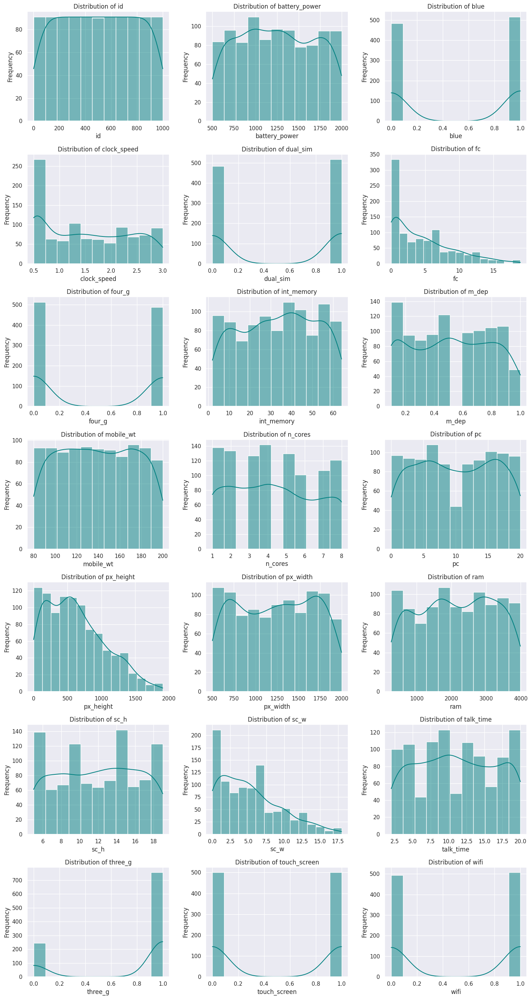

No categorical columns found (or all have high cardinality).


In [15]:
import math

# --- 1. Numerical Columns (Histograms in a Grid) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

if len(numerical_cols) > 0:
    # Defining grid size
    num_plots = len(numerical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterating and plot
    for i, col in enumerate(numerical_cols):
        sns.histplot(data=df, x=col, kde=True, ax=axes[i], color='teal') # Added color
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')

    # Hiding any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No numerical columns found.")


# --- 2. Categorical Columns (Countplots in a Grid) ---
# Filtering out columns with too many unique values (like IDs) to avoid messy plots
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]

if len(categorical_cols) > 0:
    # Defining grid size
    num_plots = len(categorical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterating and plot
    for i, col in enumerate(categorical_cols):
        sns.countplot(data=df, x=col, ax=axes[i], palette='viridis', hue=col, legend=False) # Added palette
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Count')
        axes[i].tick_params(axis='x', rotation=45)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

     # --- 3. Value Counts (Text Output) ---
    print("--- Categorical Value Counts ---")
    for col in categorical_cols:
        print(f"\nValue counts for {col}:")
        print(df[col].value_counts())
else:
    print("No categorical columns found (or all have high cardinality).")

# Bivariate Analysis

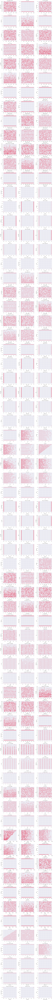

No categorical-numerical pairs found.


In [16]:

import itertools

# --- 1. Numerical-Numerical Relationships (Scatter Plots) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all unique pairs of numerical columns
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(num_pairs) > 0:
    # Defining grid size
    num_plots = len(num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (col1, col2) in enumerate(num_pairs):
        sns.scatterplot(data=df, x=col1, y=col2, ax=axes[i], alpha=0.5, color='crimson') # Added color
        axes[i].set_title(f'{col1} vs {col2}')
        axes[i].set_xlabel(col1)
        axes[i].set_ylabel(col2)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Not enough numerical columns for scatter plots.")


# --- 2. Categorical-Numerical Relationships (Box Plots) ---
# Excluding high cardinality columns
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all pairs of (Categorical, Numerical)
cat_num_pairs = list(itertools.product(categorical_cols, numerical_cols))

if len(cat_num_pairs) > 0:
    # Defining grid size
    num_plots = len(cat_num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (cat_col, num_col) in enumerate(cat_num_pairs):
        sns.boxplot(data=df, x=cat_col, y=num_col, ax=axes[i], palette='Set2', hue=cat_col, legend=False)
        axes[i].set_title(f'{num_col} by {cat_col}')
        axes[i].set_xlabel(cat_col)
        axes[i].set_ylabel(num_col)
        axes[i].tick_params(axis='x', rotation=45)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No categorical-numerical pairs found.")


# --- 3. Categorical-Categorical Relationships (Heatmaps) ---
# Generating pairs of categorical columns
cat_pairs = list(itertools.combinations(categorical_cols, 2))

if len(cat_pairs) > 0:
    num_plots = len(cat_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    # Ensuring axes is always an iterable of Axes objects
    if isinstance(axes, np.ndarray):
        axes = axes.flatten()
    else:
        axes = [axes]

    for i, (col1, col2) in enumerate(cat_pairs):
        # Creating a cross-tabulation
        crosstab = pd.crosstab(df[col1], df[col2], normalize='index')
        sns.heatmap(crosstab, annot=True, fmt='.2f', cmap='Purples', ax=axes[i])
        axes[i].set_title(f'{col1} vs {col2} (Proportion)')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Pairplot

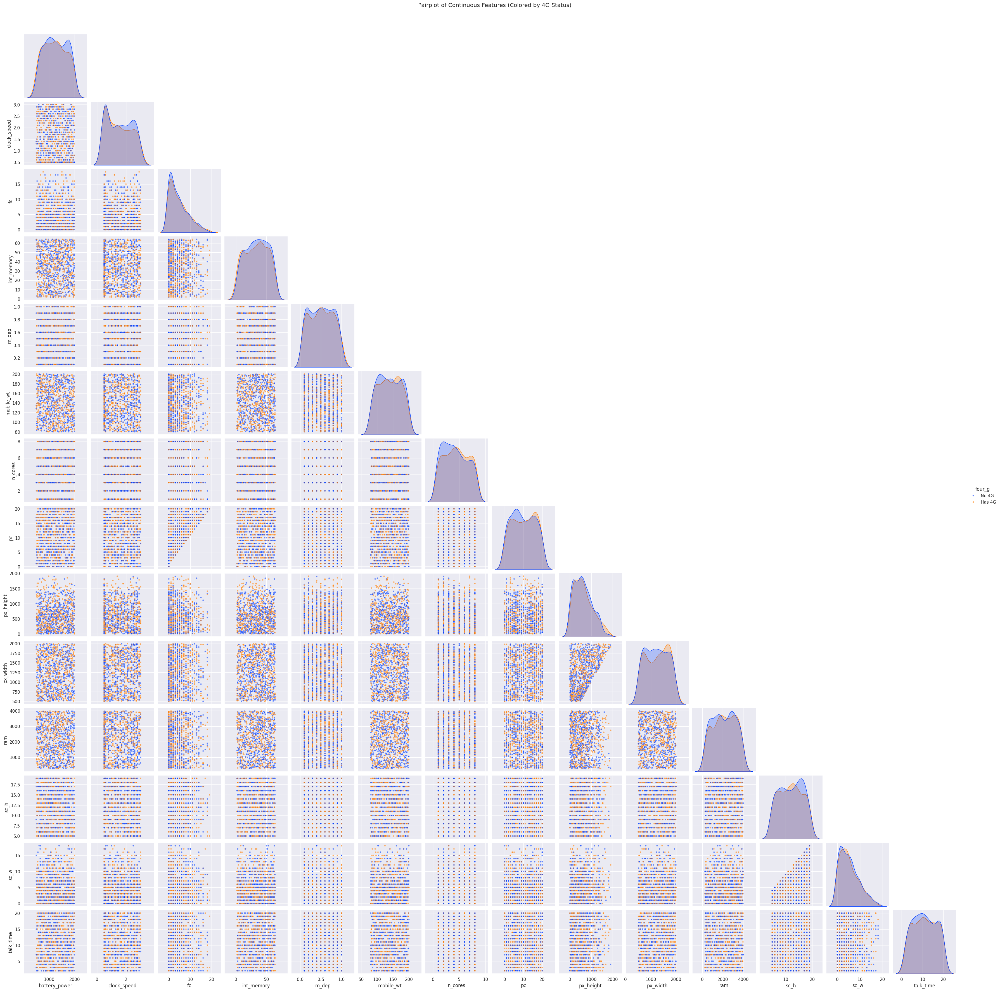

In [30]:
# Selecting columns that are numerical but have more than 2 unique values (excluding binary and ID)
cols_to_plot = [col for col in df.select_dtypes(include=np.number).columns
                if col != 'id' and df[col].nunique() > 2]

# Creating a temporary dataframe with readable labels for the hue
plot_df = df.copy()
plot_df['four_g'] = plot_df['four_g'].map({0: 'No 4G', 1: 'Has 4G'})

# Creating the pairplot with hue='four_g'
sns.pairplot(plot_df, vars=cols_to_plot, hue='four_g', corner=True, diag_kind='kde',
             palette='bright', plot_kws={'alpha':0.6, 's':15})
plt.suptitle('Pairplot of Continuous Features (Colored by 4G Status)', y=1.02)
plt.show()

# Heatmap

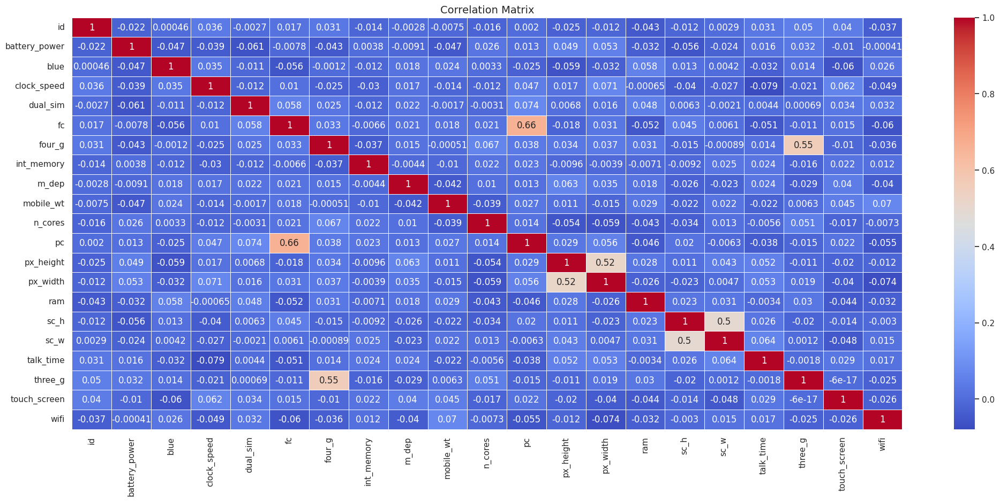

In [27]:
plt.figure(figsize=(25, 10))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Statistical Analysis

In [36]:
from scipy.stats import (
    ttest_ind,
    f_oneway,
    chi2_contingency,
    pearsonr,
    spearmanr,
    kruskal,
    mannwhitneyu
)

def interpret_test(name, p_val, alpha=0.05):
    result = "Significant" if p_val < alpha else "Not Significant"
    print(f"{name:<35} | p-value: {p_val:.4f} | Result: {result}")

print(f"{'Test Name':<35} | {'p-value':<15} | {'Result'}")
print("-" * 75)

# T-Test
t_stat, p_val_t = ttest_ind(df[df['dual_sim'] == 1]['battery_power'], df[df['dual_sim'] == 0]['battery_power'])
interpret_test("T-Test (Dual Sim vs Batt)", p_val_t)

# ANOVA
groups_anova = [df[df['n_cores'] == core]['clock_speed'] for core in df['n_cores'].unique()]
f_stat, p_val_anova = f_oneway(*groups_anova)
interpret_test("ANOVA (Cores vs Speed)", p_val_anova)

# Chi-Square
contingency = pd.crosstab(df['four_g'], df['three_g'])
chi2, p_val_chi2, dof, exp = chi2_contingency(contingency)
interpret_test("Chi2 (4G vs 3G)", p_val_chi2)

# Pearson
pearson_corr, p_val_pearson = pearsonr(df['px_height'], df['px_width'])
interpret_test("Pearson (Px Height vs Width)", p_val_pearson)

# Spearman
spearman_corr, p_val_spearman = spearmanr(df['int_memory'], df['mobile_wt'])
interpret_test("Spearman (Int Mem vs Wt)", p_val_spearman)

# Kruskal-Wallis
groups_kruskal = [df[df['n_cores'] == core]['ram'] for core in df['n_cores'].unique()]
h_stat, p_val_kruskal = kruskal(*groups_kruskal)
interpret_test("Kruskal (Cores vs RAM)", p_val_kruskal)

# Mann-Whitney
u_stat, p_val_mw = mannwhitneyu(df[df['touch_screen'] == 1]['mobile_wt'], df[df['touch_screen'] == 0]['mobile_wt'])
interpret_test("Mann-Whitney (Touch vs Wt)", p_val_mw)

if 'price_range' in df.columns:
    price_groups = [df[df['price_range'] == p]['ram'] for p in df['price_range'].unique()]
    f_stat_price, p_val_price = f_oneway(*price_groups)
    interpret_test("ANOVA (Price vs RAM)", p_val_price)

    price_contingency = pd.crosstab(df['price_range'], df['wifi'])
    chi2_price, p_val_chi_price, _, _ = chi2_contingency(price_contingency)
    interpret_test("Chi2 (Price vs Wifi)", p_val_chi_price)

Test Name                           | p-value         | Result
---------------------------------------------------------------------------
T-Test (Dual Sim vs Batt)           | p-value: 0.0531 | Result: Not Significant
ANOVA (Cores vs Speed)              | p-value: 0.8978 | Result: Not Significant
Chi2 (4G vs 3G)                     | p-value: 0.0000 | Result: Significant
Pearson (Px Height vs Width)        | p-value: 0.0000 | Result: Significant
Spearman (Int Mem vs Wt)            | p-value: 0.7390 | Result: Not Significant
Kruskal (Cores vs RAM)              | p-value: 0.3874 | Result: Not Significant
Mann-Whitney (Touch vs Wt)          | p-value: 0.1617 | Result: Not Significant


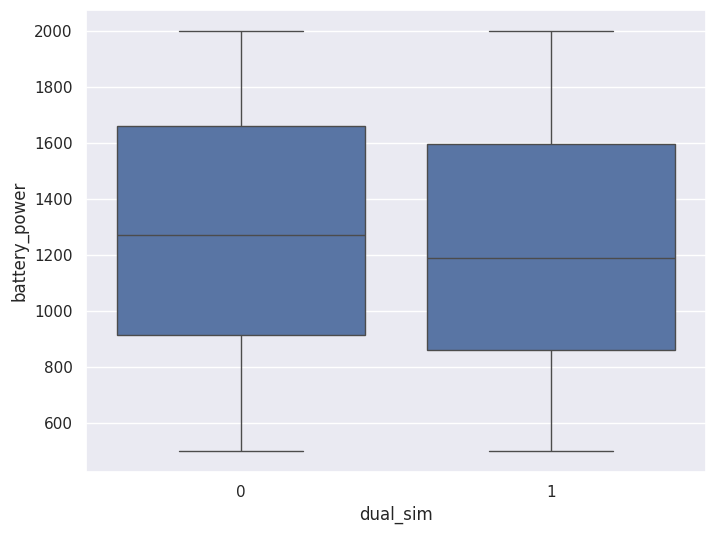

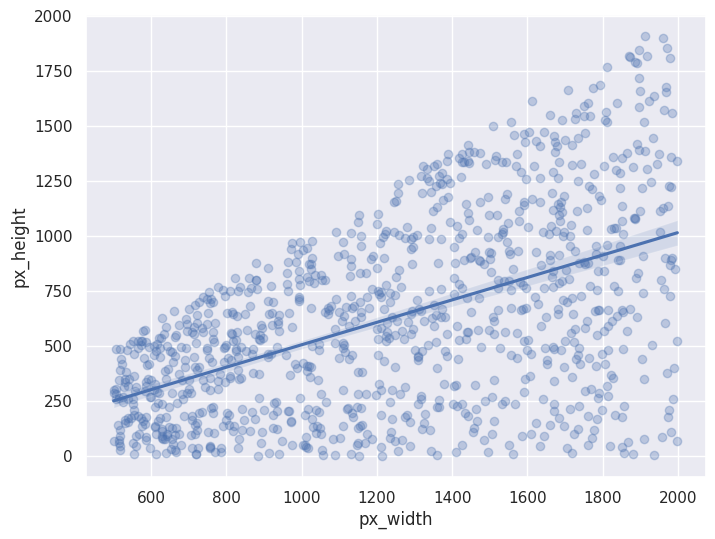

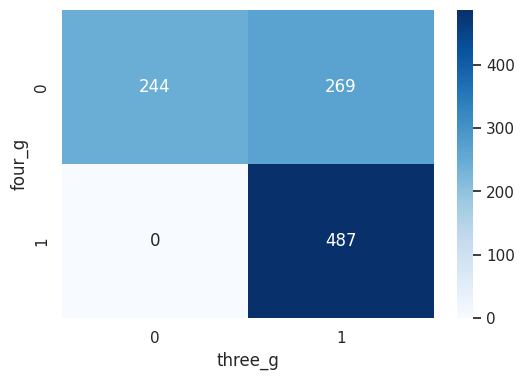

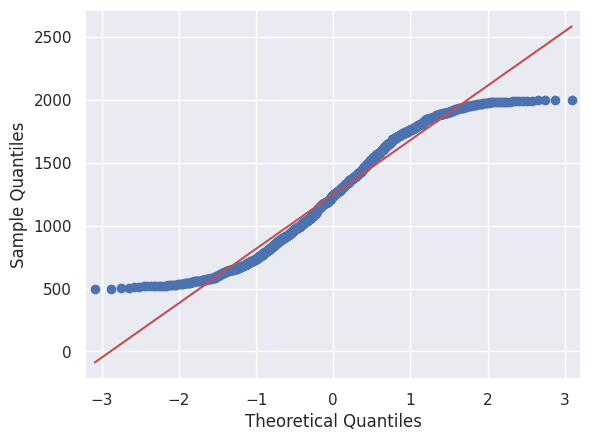

In [33]:
plt.figure(figsize=(8, 6))
sns.boxplot(x='dual_sim', y='battery_power', data=df)
plt.show()

plt.figure(figsize=(8, 6))
sns.regplot(x='px_width', y='px_height', data=df, scatter_kws={'alpha':0.3})
plt.show()

plt.figure(figsize=(6, 4))
sns.heatmap(pd.crosstab(df['four_g'], df['three_g']), annot=True, fmt='d', cmap='Blues')
plt.show()

fig = sm.qqplot(df['battery_power'].dropna(), line='s')
plt.show()

if 'price_range' in df.columns:
    plt.figure(figsize=(8, 6))
    sns.violinplot(x='price_range', y='ram', data=df)
    plt.show()

In [37]:
from scipy.stats import shapiro, levene
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import statsmodels.api as sm

# 1. Normality Test
stat_shapiro, p_val_shapiro = shapiro(df['battery_power'].dropna())
print("--- Normality Test (Shapiro-Wilk) ---")
print(f"Feature: battery_power")
print(f"p-value: {p_val_shapiro:.4e}")
if p_val_shapiro < 0.05:
    print("Interpretation: Data is likely NOT normally distributed (Reject H0)")
else:
    print("Interpretation: Data looks normally distributed (Fail to reject H0)")
print("\n")

# 2. Multicollinearity (VIF)
print("--- Multicollinearity (VIF) ---")
X_vif = df[['battery_power', 'ram', 'px_height', 'px_width', 'mobile_wt']].dropna()
X_vif = sm.add_constant(X_vif)
vif_data = pd.DataFrame()
vif_data["feature"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i) for i in range(len(X_vif.columns))]
display(vif_data)
print("Note: VIF > 5 or 10 indicates high multicollinearity.")
print("\n")

if 'price_range' in df.columns:
    print("--- Homogeneity of Variance (Levene's Test) ---")
    stat_levene, p_val_levene = levene(
        df[df['price_range'] == 0]['battery_power'].dropna(),
        df[df['price_range'] == 1]['battery_power'].dropna(),
        df[df['price_range'] == 2]['battery_power'].dropna(),
        df[df['price_range'] == 3]['battery_power'].dropna()
    )
    print(f"Levene's p-value: {p_val_levene:.4f}")

    print("\n--- Post-hoc Analysis (Tukey HSD) ---")
    tukey_result = pairwise_tukeyhsd(endog=df['ram'].dropna(), groups=df['price_range'].dropna(), alpha=0.05)
    print(tukey_result)

    print("\n--- OLS Regression Summary ---")
    X_ols = df[['battery_power', 'ram', 'px_height', 'px_width']].dropna()
    X_ols = sm.add_constant(X_ols)
    y_ols = df.loc[X_ols.index, 'price_range']
    ols_model = sm.OLS(y_ols, X_ols).fit()
    print(ols_model.summary())

--- Normality Test (Shapiro-Wilk) ---
Feature: battery_power
p-value: 1.0890e-16
Interpretation: Data is likely NOT normally distributed (Reject H0)


--- Multicollinearity (VIF) ---


,feature,VIF
0,const,38.073153
1,battery_power,1.006646
2,ram,1.004789
3,px_height,1.370872
4,px_width,1.371130
5,mobile_wt,1.003573


Note: VIF > 5 or 10 indicates high multicollinearity.




# Feature Engineering

In [39]:
print("--- 1. CREATING HARDWARE RATIOS ---")

# A. Screen Area (Height x Width)
# The AI doesn't know what height and width mean together. We must calculate the Area for it.
df['screen_area'] = df['sc_h'] * df['sc_w']
print("✅ Created: 'screen_area' (Physical size of the screen)")

# B. Pixel Area (Resolution)
df['px_area'] = df['px_height'] * df['px_width']
print("✅ Created: 'px_area' (Total screen resolution)")

# C. Pixel Density (Sharpness)
# High resolution on a small screen = Premium. Low resolution on a big screen = Cheap.
# We add a condition to avoid dividing by zero if screen_area is 0.
df['px_density'] = np.where(df['screen_area'] == 0, 0, df['px_area'] / df['screen_area'])
print("✅ Created: 'px_density' (Sharpness / PPI Proxy)")


print("\n--- 2. COMBINING FRAGMENTED FEATURES ---")

# D. Total Megapixels
# Customers usually care about the total camera power, not just front vs back.
df['total_camera_px'] = df['fc'] + df['pc'] # Front Camera + Primary Camera
print("✅ Created: 'total_camera_px' (Overall camera capability)")

# E. Connectivity Score (0 to 4)
# We combine 3G, 4G, WiFi, and Bluetooth into a single "Network Quality" score.
df['connectivity_score'] = df['three_g'] + df['four_g'] + df['wifi'] + df['blue']
print("✅ Created: 'connectivity_score' (How well connected is the phone?)")


print("\n--- 3. PERFORMANCE METRICS ---")

# F. Battery Drain Rate (Battery per Core)
# An 8-core processor drains battery faster than a 2-core processor.
# This ratio measures true battery efficiency.
# Add +1 to n_cores to strictly avoid any division by zero errors, though minimum is usually 1.
df['battery_per_core'] = df['battery_power'] / (df['n_cores'] + 0.001)
print("✅ Created: 'battery_per_core' (Hardware Efficiency)")


print("\n--- FINAL DATASET CHECK ---")
# Show the new columns we just created
new_features = ['screen_area', 'px_area', 'px_density', 'total_camera_px', 'connectivity_score', 'battery_per_core']
print(df[new_features].head())

--- 1. CREATING HARDWARE RATIOS ---
✅ Created: 'screen_area' (Physical size of the screen)
✅ Created: 'px_area' (Total screen resolution)
✅ Created: 'px_density' (Sharpness / PPI Proxy)

--- 2. COMBINING FRAGMENTED FEATURES ---
✅ Created: 'total_camera_px' (Overall camera capability)
✅ Created: 'connectivity_score' (How well connected is the phone?)

--- 3. PERFORMANCE METRICS ---
✅ Created: 'battery_per_core' (Hardware Efficiency)

--- FINAL DATASET CHECK ---
   screen_area  px_area    px_density  total_camera_px  connectivity_score  \
0           84   319112   3798.952381               30                   1   
1            0   639322      0.000000               16                   3   
2          170  1734820  10204.823529                5                   2   
3            0   516840      0.000000               38                   2   
4          120   606690   5055.750000               29                   3   

   battery_per_core  
0        347.550816  
1        168.166367  


# Machine Learning | Price Classification

--- 1. LOADING TRAINING DATA ---
⚠️ 'train.csv' missing! Downloading the complete dataset...
Dataset URL: https://www.kaggle.com/datasets/iabhishekofficial/mobile-price-classification
License(s): unknown
  0% 0.00/70.6k [00:00<?, ?B/s]
100% 70.6k/70.6k [00:00<00:00, 104MB/s]
Archive:  mobile-price-classification.zip
  inflating: test.csv                
  inflating: train.csv               
✅ Loaded 'train.csv' (2000 rows)

--- 2. APPLYING FEATURE ENGINEERING TO TRAINING DATA ---
✅ Feature Engineering applied to Training Set.

--- 3. SETTING UP THE EXAM (TRAIN/TEST SPLIT) ---
✅ Data Split Successfully!
   Training on: 1600 phones
   Testing on:  400 phones

--- 4. TRAINING THE AI (RANDOM FOREST) ---
✅ Model Trained Successfully.

--- 5. DID IT WORK? (EVALUATION) ---
🎯 Model Accuracy: 89.25%

📊 Detailed Performance Report:
              precision    recall  f1-score   support

           0       0.96      0.92      0.94       105
           1       0.83      0.90      0.86        91
   

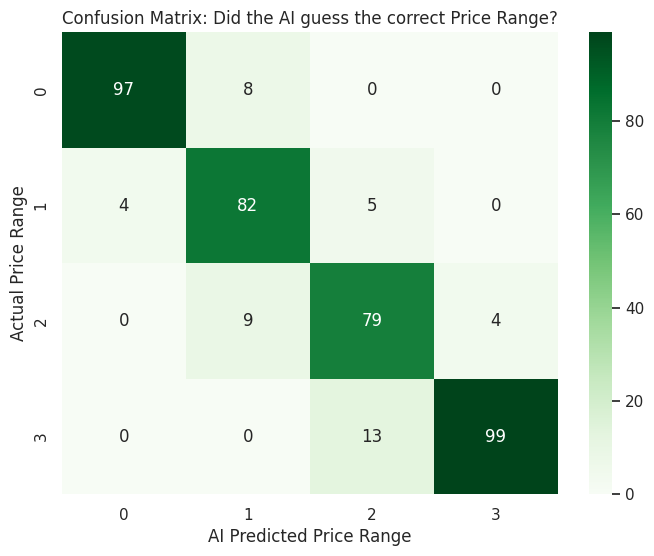


--- 6. THE 'SECRET SAUCE' (FEATURE IMPORTANCE) ---


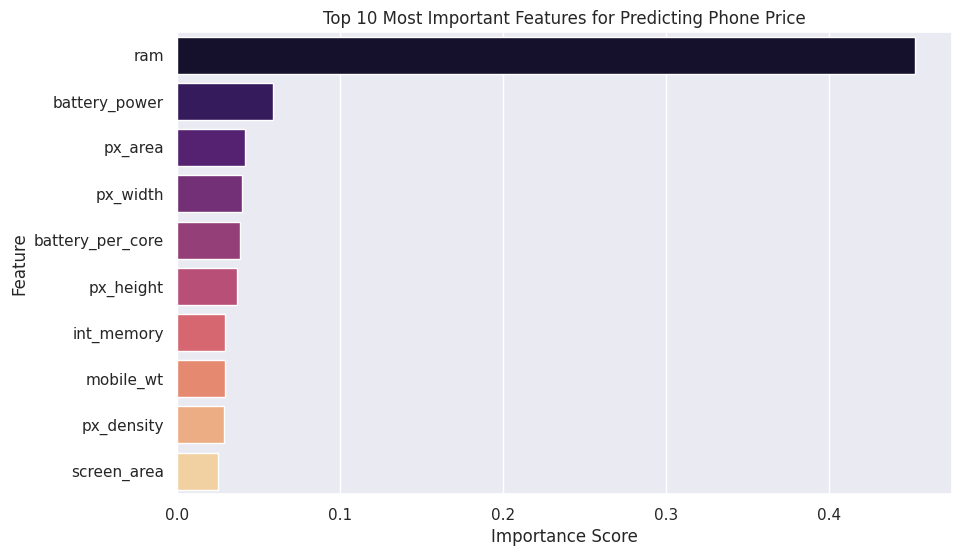

In [46]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import os

print("--- 1. LOADING TRAINING DATA ---")

# Check if train.csv exists. If not, download the correct dataset.
if not os.path.exists('train.csv'):
    print("⚠️ 'train.csv' missing! Downloading the complete dataset...")
    # Using the standard dataset source which contains both train.csv and test.csv
    !kaggle datasets download -d iabhishekofficial/mobile-price-classification --force
    !unzip -o mobile-price-classification.zip

if os.path.exists('train.csv'):
    # We need train.csv because it contains the 'price_range' (the answers)
    train_df = pd.read_csv('train.csv')
    print(f"✅ Loaded 'train.csv' ({len(train_df)} rows)")

    print("\n--- 2. APPLYING FEATURE ENGINEERING TO TRAINING DATA ---")
    # We must apply the exact same transformations to the training set that we did to the test set
    train_df['screen_area'] = train_df['sc_h'] * train_df['sc_w']
    train_df['px_area'] = train_df['px_height'] * train_df['px_width']
    train_df['px_density'] = np.where(train_df['screen_area'] == 0, 0, train_df['px_area'] / train_df['screen_area'])
    train_df['total_camera_px'] = train_df['fc'] + train_df['pc']
    train_df['connectivity_score'] = train_df['three_g'] + train_df['four_g'] + train_df['wifi'] + train_df['blue']
    train_df['battery_per_core'] = train_df['battery_power'] / (train_df['n_cores'] + 0.001)
    print("✅ Feature Engineering applied to Training Set.")

    print("\n--- 3. SETTING UP THE EXAM (TRAIN/TEST SPLIT) ---")
    target = 'price_range'

    # Define Features (X) and Target (y)
    cols_to_drop = [target]
    if 'id' in train_df.columns:
        cols_to_drop.append('id')

    X = train_df.drop(columns=cols_to_drop)
    y = train_df[target]

    # Fill any NaNs created during feature engineering with 0
    X = X.fillna(0)

    # Split the data: 80% to train the AI, 20% to test it (Validation set)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    print(f"✅ Data Split Successfully!")
    print(f"   Training on: {len(X_train)} phones")
    print(f"   Testing on:  {len(X_test)} phones")

    print("\n--- 4. TRAINING THE AI (RANDOM FOREST) ---")
    # Initialize the Random Forest
    rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
    rf_model.fit(X_train, y_train)
    print("✅ Model Trained Successfully.")

    print("\n--- 5. DID IT WORK? (EVALUATION) ---")
    # Predict on the validation set
    y_pred = rf_model.predict(X_test)

    # Calculate Overall Accuracy
    accuracy = accuracy_score(y_test, y_pred)
    print(f"🎯 Model Accuracy: {accuracy * 100:.2f}%\n")

    # Detailed Classification Report
    print("📊 Detailed Performance Report:")
    print(classification_report(y_test, y_pred))

    # Visualizing the Confusion Matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Greens')
    plt.title('Confusion Matrix: Did the AI guess the correct Price Range?')
    plt.xlabel('AI Predicted Price Range')
    plt.ylabel('Actual Price Range')
    plt.show()

    print("\n--- 6. THE 'SECRET SAUCE' (FEATURE IMPORTANCE) ---")
    importances = pd.Series(rf_model.feature_importances_, index=X.columns).sort_values(ascending=False).head(10)

    plt.figure(figsize=(10, 6))
    sns.barplot(x=importances.values, y=importances.index, palette='magma')
    plt.title('Top 10 Most Important Features for Predicting Phone Price')
    plt.xlabel('Importance Score')
    plt.ylabel('Feature')
    plt.show()
else:
    print("❌ ERROR: Failed to download 'train.csv'. Please check the dataset source.")

# Thank You